In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
#from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score


%matplotlib inline

In [ ]:
!pip install catboost
from catboost import Pool,CatBoostClassifier

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.8 MB 1.2 MB/s 


In [ ]:
df_train = pd.read_csv("/content/train_dataset_train.csv")
df_test = pd.read_csv("/content/test_dataset_test.csv")

df_calls = pd.read_csv("/content/Calls.csv",decimal=',')
df_connection_time = pd.read_csv("/content/ConnectionTime.csv")
df_ed = pd.read_csv("/content/Education.csv")
df_WD = pd.read_csv("/content/WorkingDay.csv")
df_SKUD = pd.read_csv("/content/SKUD.csv",decimal=',')
df_TN = pd.read_csv("/content/TimenNetwork.csv")
df_tasks = pd.read_csv("/content/Tasks.csv")


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (1,7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df_train.head()

,id,type
0,ОРГ1-02050,2
1,ОРГ1-02783,2
2,ОРГ2-06173,0
3,ОРГ2-05359,2
4,ОРГ1-00803,2


In [ ]:
df_test.head()

,id,type
0,ОРГ1-02649,0
1,ОРГ2-05929,0
2,ОРГ2-05859,0
3,ОРГ1-00279,0
4,ОРГ2-01613,0


In [ ]:
df_calls.head()

,Date,CallTime,NumberOfCalls,Вид учета времени,InOut,id
0,"2021-08-16 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
1,"2021-09-21 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
2,"2021-01-11 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
3,"2021-01-18 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
4,"2021-01-27 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945


In [ ]:
df_connection_time.head()

,dateNum,maxLogOff,Нормативное время начала раб.дня,Фактич. время начала раб.дня,Время опоздания,Признак опоздания,Вых/Будни,id
0,"2021-12-15 00:00:00,000","2021-12-15 17:30:27,246","1899-12-30 08:30:00,000","1899-12-30 08:24:18,606",NaN,NaN,Будни,ОРГ1-02782
1,"2021-12-15 00:00:00,000","2021-12-15 16:30:13,330","1899-12-30 08:30:00,000","1899-12-30 01:05:20,513",NaN,NaN,Будни,ОРГ1-01407
2,"2021-12-15 00:00:00,000","2021-12-15 15:27:37,246","1899-12-30 08:30:00,000","1899-12-30 05:47:33,156",NaN,NaN,Будни,ОРГ1-01909
3,"2021-12-15 00:00:00,000","2021-12-15 20:35:14,833","1899-12-30 08:30:00,000","1899-12-30 08:28:43,956",NaN,NaN,Будни,ОРГ1-00254
4,"2021-12-15 00:00:00,000","2021-12-15 17:32:16,913","1899-12-30 08:30:00,000","1899-12-30 08:16:02,896",NaN,NaN,Будни,ОРГ1-02543


In [ ]:
df_ed.head()

,Табельный номер руководителя,id,Вид образования,Специальность
0,NaN,ОРГ1-00131,Высшее образование - бакалавриат,Юриспруденция
1,NaN,ОРГ1-03220,Среднее профессиональное образование,Финансы
2,NaN,ОРГ1-03008,Высшее образование,Юриспруденция
3,NaN,ОРГ1-00922,Высшее образование - бакалавриат,Бакалавр технических наук
4,NaN,ОРГ1-00922,Высшее образование,Машины и аппараты химических производств и пре...


In [ ]:
df_WD.head()

,startTime,activeTime,Вых/Будни,monitorTime,id
0,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01553
1,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-02112
2,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-02112
3,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01846
4,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01846


In [ ]:
df_SKUD.head()

,Дата,Приход.1,Уход.1,Длительность общая,Длительность раб.дня без обеда,Вых/Будни,id
0,"2021-03-01 00:00:00,000","1899-12-30 08:11:00,000","1899-12-30 17:32:00,000",9.350000,8.350000,Будни,ОРГ1-00791
1,"2021-03-01 00:00:00,000","1899-12-30 08:25:00,000","1899-12-30 17:32:00,000",9.116667,8.116667,Будни,ОРГ1-01826
2,"2021-03-01 00:00:00,000","1899-12-30 08:31:00,000","1899-12-30 17:32:00,000",9.016667,8.016667,Будни,ОРГ1-00713
3,"2021-03-01 00:00:00,000","1899-12-30 08:31:00,000","1899-12-30 17:32:00,000",9.016667,8.016667,Будни,ОРГ1-02127
4,"2021-03-01 00:00:00,000","1899-12-30 08:19:00,000","1899-12-30 17:32:00,000",9.216667,8.216667,Будни,ОРГ1-01739


In [ ]:
df_SKUD['Вых/Будни'].value_counts()

Будни           22277
Выходные дни      303
Name: Вых/Будни, dtype: int64

In [ ]:
df_TN.head()

,Вых/Будни,monitor_Time,startTime,id
0,Будни,300,"2021-08-16 00:00:00,000",ОРГ1-01402
1,Будни,300,"2021-08-18 00:00:00,000",ОРГ1-01402
2,Будни,300,"2021-08-19 00:00:00,000",ОРГ1-01402
3,Будни,300,"2021-08-23 00:00:00,000",ОРГ1-01402
4,Будни,300,"2021-08-26 00:00:00,000",ОРГ1-01402


In [ ]:
df_tasks.head()

,Статус по просрочке,Срок плановый,"Просрочено, дней",ДлительностьПросрочки,ID задачи,Вид документа,Дата старта задания,Дата завершения задания плановая,Дата завершения задания фактическая,Состояние задания,id
0,Без нарушения срока,NaN,0,без нарушения срока,E1DE844D-EE2D-4C41-AEDF-93F246749F0E,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
1,Без нарушения срока,NaN,0,без нарушения срока,7A92343C-8C9A-46E7-AC81-8F50F95009D0,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
2,Без нарушения срока,NaN,0,без нарушения срока,5CE64E52-D2D1-4DCC-B2C8-34734AA39AC0,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
3,Без нарушения срока,NaN,0,без нарушения срока,7A28F3DD-983F-4127-AB7F-6EDB85A69F1C,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
4,Без нарушения срока,NaN,0,без нарушения срока,ABFFAF61-12D8-44C2-B1F6-8402D174889E,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588


In [ ]:
print("df_train", df_train.shape)
print("df_calls", df_calls.shape)
print("df_connection_time", df_connection_time.shape)
print("df_ed", df_ed.shape)
print("df_test", df_test.shape)
print("df_WD",df_WD.shape)
print("df_SKUD",df_SKUD.shape)
print("df_TN",df_TN.shape)
print("df_tasks",df_tasks.shape)



df_train (550, 2)
df_calls (407867, 6)
df_connection_time (230662, 8)
df_ed (5609, 4)
df_test (262, 2)
df_WD (1971927, 5)
df_SKUD (22580, 7)
df_TN (216110, 4)
df_tasks (536660, 11)


In [ ]:
print(df_train.info())
print("---------------")
print(df_calls.info())
print("---------------")
print(df_connection_time.info())
print("---------------")
print(df_ed.info())
print("---------------")
print(df_test.info())
print("---------------")
print(df_WD.info())
print("---------------")
print(df_SKUD.info())
print("---------------")
print(df_TN.info())
print("---------------")
print(df_tasks.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550 entries, 0 to 549
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      550 non-null    object
 1   type    550 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 8.7+ KB
None
---------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 407867 entries, 0 to 407866
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date               407867 non-null  object 
 1   CallTime           407867 non-null  float64
 2   NumberOfCalls      407867 non-null  int64  
 3   Вид учета времени  392655 non-null  object 
 4   InOut              407867 non-null  object 
 5   id                 407867 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 18.7+ MB
None
---------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230662 entries, 0 to 230661
Data columns (tot

In [ ]:
df_ed["id"].value_counts()

ОРГ1-02554    15
ОРГ1-02179    13
ОРГ1-00483    10
ОРГ1-02013     9
ОРГ1-01806     8
              ..
ОРГ2-06199     1
ОРГ2-02971     1
ОРГ2-07932     1
ОРГ2-05408     1
ОРГ2-02124     1
Name: id, Length: 4788, dtype: int64

In [ ]:
df_train['type'].value_counts()

2    298
0    153
1     74
3     25
Name: type, dtype: int64

In [ ]:
df_train['id']

0      ОРГ1-02050
1      ОРГ1-02783
2      ОРГ2-06173
3      ОРГ2-05359
4      ОРГ1-00803
          ...    
545    ОРГ1-02587
546    ОРГ1-02383
547    ОРГ1-02862
548    ОРГ1-00471
549    ОРГ2-02694
Name: id, Length: 550, dtype: object

In [ ]:
df_train["ОРГ"]= df_train['id'].str.extract('(\d+)').fillna('')

In [ ]:
df_train["ОРГ"].value_counts()

1    406
2    144
Name: ОРГ, dtype: int64

In [ ]:
df_train["ОРГ2"] = df_train['id'].str.extract('(\d+\d+)').fillna('').astype(int)

In [ ]:
df_train.head(3)

,id,type,ОРГ,ОРГ2
0,ОРГ1-02050,2,1,2050
1,ОРГ1-02783,2,1,2783
2,ОРГ2-06173,0,2,6173


In [ ]:
df_train_new = pd.merge(df_train, df_ed , on="id", how='left').drop_duplicates(subset="id")

df_train_new.head()

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность
0,ОРГ1-02050,2,1,2050,NaN,Неполное высшее образование,Технологические машины и оборудование
2,ОРГ1-02783,2,1,2783,ОРГ1-01974,Высшее образование,Автоматизация технологических процессов и прои...
3,ОРГ2-06173,0,2,6173,ОРГ2-01170,Высшее образование,Управление качеством
4,ОРГ2-05359,2,2,5359,ОРГ2-09100,Среднее профессиональное образование,Технолог-сварщик
5,ОРГ1-00803,2,1,803,NaN,Высшее образование,Журналистика


In [ ]:
df_train_new['Табельный номер руководителя'] =np.where(df_train_new['Табельный номер руководителя'].isnull(), 0 ,1)
#не лучший вариант, в идеале передавать информацию по образованности руководителя 



In [ ]:
df_train_new['Вид образования'] = df_train_new['Вид образования'].fillna('Отсутствует/нет данных')
df_train_new['Специальность'] = df_train_new['Специальность'].fillna('Отсутствует/нет данных')

In [ ]:
df_train_new['Вид образования'].value_counts()

Высшее образование                                297
Отсутствует/нет данных                             73
Среднее профессиональное образование               64
Высшее образование - бакалавриат                   59
Высшее образование - специалитет, магистратура     30
Начальное профессиональное образование              7
Повышение квалификации                              7
Неполное высшее образование                         5
Среднее общее образование                           3
Среднее (полное) общее образование                  2
Переподготовка                                      2
Профессиональное обучение                           1
Name: Вид образования, dtype: int64

In [ ]:
df_train_new

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность
0,ОРГ1-02050,2,1,2050,0,Неполное высшее образование,Технологические машины и оборудование
2,ОРГ1-02783,2,1,2783,1,Высшее образование,Автоматизация технологических процессов и прои...
3,ОРГ2-06173,0,2,6173,1,Высшее образование,Управление качеством
4,ОРГ2-05359,2,2,5359,1,Среднее профессиональное образование,Технолог-сварщик
5,ОРГ1-00803,2,1,803,0,Высшее образование,Журналистика
...,...,...,...,...,...,...,...
768,ОРГ1-02587,2,1,2587,0,Отсутствует/нет данных,Отсутствует/нет данных
769,ОРГ1-02383,2,1,2383,0,Высшее образование,"Проектирование, сооружение и эксплуатация газо..."
770,ОРГ1-02862,2,1,2862,0,Отсутствует/нет данных,Отсутствует/нет данных
771,ОРГ1-00471,2,1,471,0,Отсутствует/нет данных,Обеспечение экологической безопасности при раб...


In [ ]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 773
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   id                            550 non-null    object
 1   type                          550 non-null    int64 
 2   ОРГ                           550 non-null    object
 3   ОРГ2                          550 non-null    int64 
 4   Табельный номер руководителя  550 non-null    int64 
 5   Вид образования               550 non-null    object
 6   Специальность                 550 non-null    object
dtypes: int64(3), object(4)
memory usage: 34.4+ KB


In [ ]:
df_tasks.head()

,Статус по просрочке,Срок плановый,"Просрочено, дней",ДлительностьПросрочки,ID задачи,Вид документа,Дата старта задания,Дата завершения задания плановая,Дата завершения задания фактическая,Состояние задания,id
0,Без нарушения срока,NaN,0,без нарушения срока,E1DE844D-EE2D-4C41-AEDF-93F246749F0E,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
1,Без нарушения срока,NaN,0,без нарушения срока,7A92343C-8C9A-46E7-AC81-8F50F95009D0,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
2,Без нарушения срока,NaN,0,без нарушения срока,5CE64E52-D2D1-4DCC-B2C8-34734AA39AC0,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
3,Без нарушения срока,NaN,0,без нарушения срока,7A28F3DD-983F-4127-AB7F-6EDB85A69F1C,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588
4,Без нарушения срока,NaN,0,без нарушения срока,ABFFAF61-12D8-44C2-B1F6-8402D174889E,Служебная записка,"2021-12-10 00:00:00,000",NaN,"2021-12-10 00:00:00,000",Завершено,ОРГ1-02588


In [ ]:
df_tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536660 entries, 0 to 536659
Data columns (total 11 columns):
 #   Column                               Non-Null Count   Dtype 
---  ------                               --------------   ----- 
 0   Статус по просрочке                  536660 non-null  object
 1   Срок плановый                        15821 non-null   object
 2   Просрочено, дней                     536660 non-null  int64 
 3   ДлительностьПросрочки                536660 non-null  object
 4   ID задачи                            536660 non-null  object
 5   Вид документа                        533143 non-null  object
 6   Дата старта задания                  536660 non-null  object
 7   Дата завершения задания плановая     274057 non-null  object
 8   Дата завершения задания фактическая  520683 non-null  object
 9   Состояние задания                    536660 non-null  object
 10  id                                   536660 non-null  object
dtypes: int64(1), object(10)
me

In [ ]:
df_tasks['Вид документа'] = df_tasks['Вид документа'].fillna("Без вида")

In [ ]:
df_tasks['Вид документа'].value_counts()

Служебная записка                              219740
Входящий                                        85972
Исходящий                                       76326
Приказ                                          43382
Внутренний документ                             27526
Договор                                         21082
Дополнительное соглашение                       20128
Акт                                             17999
Распоряжение                                     5898
Файл                                             5704
Протокол                                         3519
Без вида                                         3517
Исходящий РМЗ                                    2748
Внутренний документ для БП синхронизация 1С      2201
Запрос на внесение изменений                      665
Отчет по ВА                                       253
Name: Вид документа, dtype: int64

In [ ]:
df_tasks['Состояние задания'].value_counts()

Завершено                  520779
Не начато                    7842
В работе                     7571
Делегировано                  344
На приёмке                     60
Отложено                       55
Возврат с делегирования         9
Name: Состояние задания, dtype: int64

In [ ]:
df_tasks['ДлительностьПросрочки'] = df_tasks['ДлительностьПросрочки'].fillna('без нарушения срока')

In [ ]:
df_tasks['ДлительностьПросрочки'].value_counts()

без нарушения срока    454148
более 30 дней           34620
до 7 дней               31984
до 30 дней              15908
Name: ДлительностьПросрочки, dtype: int64

In [ ]:

for i in set(df_tasks['ДлительностьПросрочки'].tolist()):
    df_sup = df_tasks[df_tasks['ДлительностьПросрочки'] == i]
    df_sup = df_sup[["id","ДлительностьПросрочки"]]
    df_sup = df_sup.rename(columns={'ДлительностьПросрочки': i})
    df_sup = df_sup.groupby("id").count()
    df_train_new = pd.merge(df_train_new, df_sup , on="id", how='left')
    df_train_new[i] = df_train_new[i].fillna(0)
df_train_new.head()


for i in set(df_tasks['Вид документа'].tolist()):
    df_sup = df_tasks[df_tasks['Вид документа'] == i]
    df_sup = df_sup[["id",'Вид документа']]
    df_sup = df_sup.rename(columns={'Вид документа': i})
    df_sup = df_sup.groupby("id").count()
    df_train_new = pd.merge(df_train_new, df_sup , on="id", how='left')
    df_train_new[i] = df_train_new[i].fillna(0)
df_train_new.head()

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Исходящий,Запрос на внесение изменений,Отчет по ВА,Файл,Протокол,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение
0,ОРГ1-02050,2,1,2050,0,Неполное высшее образование,Технологические машины и оборудование,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,ОРГ1-02783,2,1,2783,1,Высшее образование,Автоматизация технологических процессов и прои...,25.0,7.0,256.0,...,0.0,0.0,0.0,5.0,0.0,0.0,31.0,28.0,0.0,0.0
2,ОРГ2-06173,0,2,6173,1,Высшее образование,Управление качеством,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,ОРГ2-05359,2,2,5359,1,Среднее профессиональное образование,Технолог-сварщик,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ОРГ1-00803,2,1,803,0,Высшее образование,Журналистика,0.0,4.0,141.0,...,152.0,0.0,0.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0


In [ ]:
set(df_tasks['Вид документа'].tolist())

{'Акт',
 'Без вида',
 'Внутренний документ',
 'Внутренний документ для БП синхронизация 1С',
 'Входящий',
 'Договор',
 'Дополнительное соглашение',
 'Запрос на внесение изменений',
 'Исходящий',
 'Исходящий РМЗ',
 'Отчет по ВА',
 'Приказ',
 'Протокол',
 'Распоряжение',
 'Служебная записка',
 'Файл'}

In [ ]:
df_train_new['Наиболее частый тип'] = df_train_new[['Акт',
 'Без вида',
 'Внутренний документ',
 'Внутренний документ для БП синхронизация 1С',
 'Входящий',
 'Договор',
 'Дополнительное соглашение',
 'Запрос на внесение изменений',
 'Исходящий',
 'Исходящий РМЗ',
 'Отчет по ВА',
 'Приказ',
 'Протокол',
 'Распоряжение',
 'Служебная записка',
 'Файл']].idxmax(axis=1)

In [ ]:
set(df_tasks['ДлительностьПросрочки'].tolist())

{'без нарушения срока', 'более 30 дней', 'до 30 дней', 'до 7 дней'}

In [ ]:
df_train_new['Наиболее частый тип просрочки'] = df_train_new[['без нарушения срока', 'более 30 дней', 'до 30 дней', 'до 7 дней']].idxmax(axis=1)

In [ ]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 549
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           550 non-null    object 
 1   type                                         550 non-null    int64  
 2   ОРГ                                          550 non-null    object 
 3   ОРГ2                                         550 non-null    int64  
 4   Табельный номер руководителя                 550 non-null    int64  
 5   Вид образования                              550 non-null    object 
 6   Специальность                                550 non-null    object 
 7   до 30 дней                                   550 non-null    float64
 8   более 30 дней                                550 non-null    float64
 9   без нарушения срока                          550 non-null    float64
 10  до

In [ ]:
df_connection_time['Признак опоздания'].value_counts()

Опоздание    77520
Name: Признак опоздания, dtype: int64

In [ ]:
df_connection_time_res = df_connection_time[["id","Признак опоздания"]]
df_connection_time_res = df_connection_time_res[df_connection_time_res["Признак опоздания"].notna()] 

df_connection_time_res.head()


,id,Признак опоздания
127561,ОРГ1-01589,Опоздание
127562,ОРГ1-01589,Опоздание
127563,ОРГ1-01589,Опоздание
127564,ОРГ1-01589,Опоздание
127565,ОРГ1-01589,Опоздание


In [ ]:
df_connection_time_res = df_connection_time_res.groupby("id").count()
df_connection_time_res = df_connection_time_res.rename(columns={"Признак опоздания": "Число опозданий"})

df_connection_time_res.head(3)

,Число опозданий
id,
ОРГ1-00004,275
ОРГ1-00028,35
ОРГ1-00030,57


In [ ]:
df_train_new = pd.merge(df_train_new, df_connection_time_res , on="id", how='left')#.drop(["event_type"],axis =1)

df_train_new.head()

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Файл,Протокол,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение,Наиболее частый тип,Наиболее частый тип просрочки,Число опозданий
0,ОРГ1-02050,2,1,2050,0,Неполное высшее образование,Технологические машины и оборудование,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Приказ,без нарушения срока,5.0
1,ОРГ1-02783,2,1,2783,1,Высшее образование,Автоматизация технологических процессов и прои...,25.0,7.0,256.0,...,5.0,0.0,0.0,31.0,28.0,0.0,0.0,Входящий,без нарушения срока,7.0
2,ОРГ2-06173,0,2,6173,1,Высшее образование,Управление качеством,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,22.0
3,ОРГ2-05359,2,2,5359,1,Среднее профессиональное образование,Технолог-сварщик,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,6.0
4,ОРГ1-00803,2,1,803,0,Высшее образование,Журналистика,0.0,4.0,141.0,...,2.0,0.0,2.0,2.0,2.0,0.0,0.0,Исходящий,без нарушения срока,35.0


In [ ]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 549
Data columns (total 30 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           550 non-null    object 
 1   type                                         550 non-null    int64  
 2   ОРГ                                          550 non-null    object 
 3   ОРГ2                                         550 non-null    int64  
 4   Табельный номер руководителя                 550 non-null    int64  
 5   Вид образования                              550 non-null    object 
 6   Специальность                                550 non-null    object 
 7   до 30 дней                                   550 non-null    float64
 8   более 30 дней                                550 non-null    float64
 9   без нарушения срока                          550 non-null    float64
 10  до

In [ ]:
df_train_new['Число опозданий'] = df_train_new['Число опозданий'].fillna(0)


In [ ]:
df_train_new.head(3)

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Файл,Протокол,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение,Наиболее частый тип,Наиболее частый тип просрочки,Число опозданий
0,ОРГ1-02050,2,1,2050,0,Неполное высшее образование,Технологические машины и оборудование,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Приказ,без нарушения срока,5.0
1,ОРГ1-02783,2,1,2783,1,Высшее образование,Автоматизация технологических процессов и прои...,25.0,7.0,256.0,...,5.0,0.0,0.0,31.0,28.0,0.0,0.0,Входящий,без нарушения срока,7.0
2,ОРГ2-06173,0,2,6173,1,Высшее образование,Управление качеством,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,22.0


In [ ]:
df_SKUD_new = df_SKUD[['id','Длительность раб.дня без обеда','Вых/Будни']]

In [ ]:
df_SKUD_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22580 entries, 0 to 22579
Data columns (total 3 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              22580 non-null  object 
 1   Длительность раб.дня без обеда  22580 non-null  float64
 2   Вых/Будни                       22580 non-null  object 
dtypes: float64(1), object(2)
memory usage: 529.3+ KB


In [ ]:
#df_SKUD_weekend = df_SKUD_new[df_SKUD_new['Вых/Будни'] == 'Выходные дни']

In [ ]:
#df_SKUD_weekend = df_SKUD_weekend[['id','Длительность раб.дня без обеда']]
#df_SKUD_weekend = df_SKUD_weekend.rename(columns={"Длительность раб.дня без обеда": "Работа в вых."})

In [ ]:
#df_SKUD_weekend = df_SKUD_weekend.groupby('id').sum()

In [ ]:
#df_SKUD_weekend['Работа в вых.']=np.where(df_SKUD_weekend['Работа в вых.'].isnull(), 0 ,1)

In [ ]:
#df_train_new = pd.merge(df_train_new, df_SKUD_weekend, on="id", how='left')

In [ ]:
#df_train_new['Работа в вых.']

In [ ]:
#df_train_new['Работа в вых.'] = df_train_new['Работа в вых.'].astype(int)

In [ ]:
#df_train_new.info()#может вместоэтого сделать работал в выходные/нет?(пробуем)

In [ ]:
#df_train_new['Работа в вых.'] = df_train_new['Работа в вых.'].fillna(0)

In [ ]:
df_SKUD_weekday = df_SKUD_new[df_SKUD_new['Вых/Будни'] == 'Будни']


In [ ]:
df_SKUD_weekday = df_SKUD_weekday[['id','Длительность раб.дня без обеда']]
df_SKUD_weekday = df_SKUD_weekday.rename(columns={"Длительность раб.дня без обеда": "Время работы в буд."})

In [ ]:
df_SKUD_weekday_mean = df_SKUD_weekday.groupby('id').mean()
df_SKUD_weekday_mean = df_SKUD_weekday_mean.rename(columns={"Время работы в буд.": "Время работы в буд. среднее"})
df_SKUD_weekday = df_SKUD_weekday.groupby('id').sum()

In [ ]:
df_SKUD_weekday_mean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863 entries, ОРГ1-00002 to ОРГ1-08590
Data columns (total 1 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Время работы в буд. среднее  863 non-null    float64
dtypes: float64(1)
memory usage: 13.5+ KB


In [ ]:
df_train_new = pd.merge(df_train_new, df_SKUD_weekday , on="id", how='left')

In [ ]:
df_train_new = pd.merge(df_train_new, df_SKUD_weekday_mean , on="id", how='left')#.drop_duplicates(subset="id")

In [ ]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 549
Data columns (total 32 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           550 non-null    object 
 1   type                                         550 non-null    int64  
 2   ОРГ                                          550 non-null    object 
 3   ОРГ2                                         550 non-null    int64  
 4   Табельный номер руководителя                 550 non-null    int64  
 5   Вид образования                              550 non-null    object 
 6   Специальность                                550 non-null    object 
 7   до 30 дней                                   550 non-null    float64
 8   более 30 дней                                550 non-null    float64
 9   без нарушения срока                          550 non-null    float64
 10  до

In [ ]:
df_train_new['Время работы в буд.'] = df_train_new['Время работы в буд.'].fillna(df_train_new['Время работы в буд.'].min())
df_train_new['Время работы в буд. среднее'] = df_train_new['Время работы в буд. среднее'].fillna(df_train_new['Время работы в буд. среднее'].min())

In [ ]:
df_train_new.head(3)

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение,Наиболее частый тип,Наиболее частый тип просрочки,Число опозданий,Время работы в буд.,Время работы в буд. среднее
0,ОРГ1-02050,2,1,2050,0,Неполное высшее образование,Технологические машины и оборудование,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,Приказ,без нарушения срока,5.0,259.683333,8.376882
1,ОРГ1-02783,2,1,2783,1,Высшее образование,Автоматизация технологических процессов и прои...,25.0,7.0,256.0,...,0.0,31.0,28.0,0.0,0.0,Входящий,без нарушения срока,7.0,0.116667,0.116667
2,ОРГ2-06173,0,2,6173,1,Высшее образование,Управление качеством,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,22.0,0.116667,0.116667


In [ ]:
df_calls.head()

,Date,CallTime,NumberOfCalls,Вид учета времени,InOut,id
0,"2021-08-16 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
1,"2021-09-21 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
2,"2021-01-11 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
3,"2021-01-18 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945
4,"2021-01-27 00:00:00,000",0.000278,1,Будни,ToUser,ОРГ1-01945


In [ ]:
df_calls[df_calls['NumberOfCalls'] == 105]

,Date,CallTime,NumberOfCalls,Вид учета времени,InOut,id
157882,"2021-04-26 00:00:00,000",3.098056,105,Будни,FromUser,ОРГ1-00772


In [ ]:
df_calls_ToUser = df_calls[df_calls['InOut'] == 'ToUser']
df_calls_FromUser = df_calls[df_calls['InOut'] == 'FromUser']
df_calls_ToUser = df_calls_ToUser[['id','CallTime']]
df_calls_FromUser = df_calls_FromUser[['id','CallTime']]
df_calls_ToUser = df_calls_ToUser.rename(columns={'CallTime': "CallTime_ToUser"})
df_calls_FromUser = df_calls_FromUser.rename(columns={'CallTime': "CallTime_FromUser"})

df_calls_ToUser = df_calls_ToUser.groupby('id').sum()
df_calls_FromUser = df_calls_FromUser.groupby('id').sum()


In [ ]:
df_train_new = pd.merge(df_train_new, df_calls_ToUser , on="id", how='left')
df_train_new = pd.merge(df_train_new, df_calls_FromUser , on="id", how='left')

In [ ]:
df_train_new['CallTime_ToUser'] = df_train_new['CallTime_ToUser'].fillna(0)
df_train_new['CallTime_FromUser'] = df_train_new['CallTime_FromUser'].fillna(0)

In [ ]:
df_WD.head()

,startTime,activeTime,Вых/Будни,monitorTime,id
0,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01553
1,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-02112
2,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-02112
3,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01846
4,"2021-11-30 00:00:00,000",2,Будни,2,ОРГ1-01846


In [ ]:
df_WD_a = df_WD[['id','activeTime']]
df_WD_m = df_WD[['id','monitorTime']]
df_WD_a = df_WD_a.groupby('id').mean()
df_WD_m = df_WD_m.groupby('id').mean()


In [ ]:
df_train_new = pd.merge(df_train_new, df_WD_a , on="id", how='left')
df_train_new = pd.merge(df_train_new, df_WD_m , on="id", how='left')

In [ ]:
df_train_new['activeTime'] = df_train_new['activeTime'].fillna(df_train_new['activeTime'].min())
df_train_new['monitorTime'] = df_train_new['monitorTime'].fillna(df_train_new['monitorTime'].min())


In [ ]:
df_train_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 549
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           550 non-null    object 
 1   type                                         550 non-null    int64  
 2   ОРГ                                          550 non-null    object 
 3   ОРГ2                                         550 non-null    int64  
 4   Табельный номер руководителя                 550 non-null    int64  
 5   Вид образования                              550 non-null    object 
 6   Специальность                                550 non-null    object 
 7   до 30 дней                                   550 non-null    float64
 8   более 30 дней                                550 non-null    float64
 9   без нарушения срока                          550 non-null    float64
 10  до

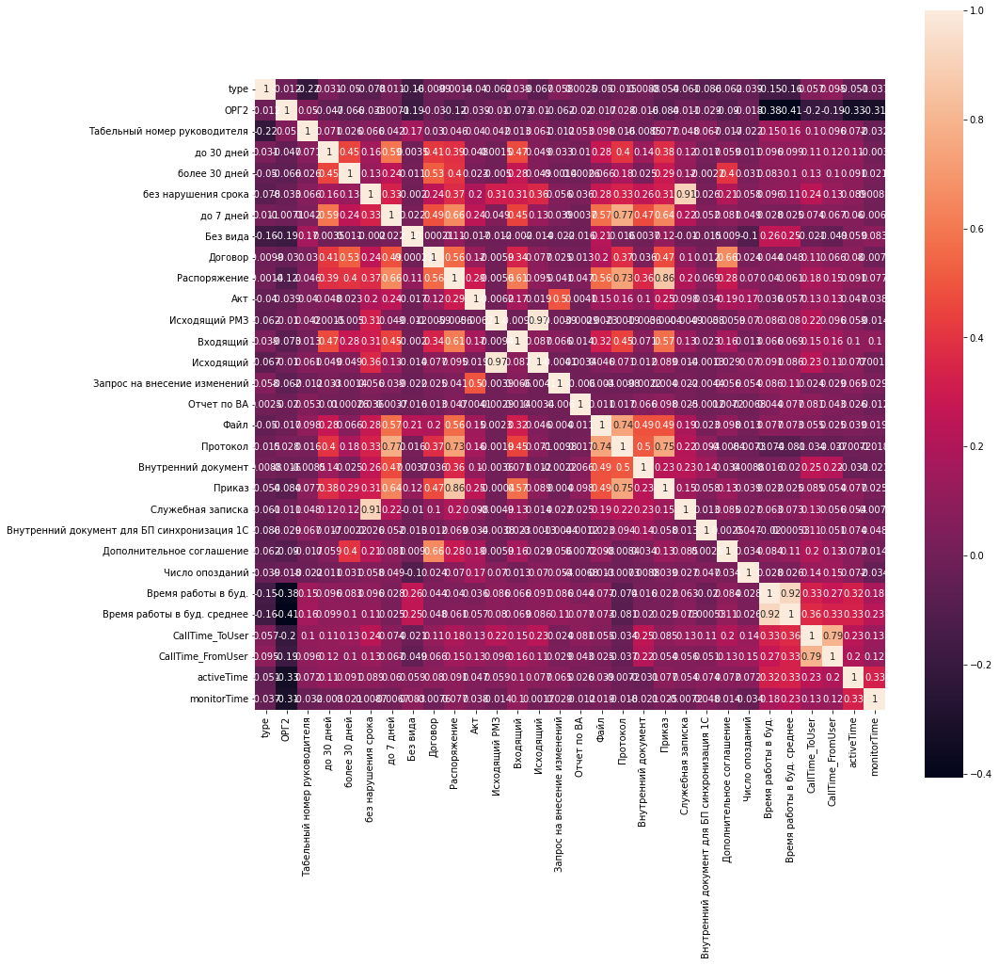

In [ ]:
plt.rcParams['figure.figsize']=(15,15)
g = sns.heatmap(df_train_new.corr(), square = True, annot=True)

In [ ]:
#создаем выборки
X = df_train_new.drop(["id", "type"], axis = 1)
y = df_train_new[["type"]]

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 550 entries, 0 to 549
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   ОРГ                                          550 non-null    object 
 1   ОРГ2                                         550 non-null    int64  
 2   Табельный номер руководителя                 550 non-null    int64  
 3   Вид образования                              550 non-null    object 
 4   Специальность                                550 non-null    object 
 5   до 30 дней                                   550 non-null    float64
 6   более 30 дней                                550 non-null    float64
 7   без нарушения срока                          550 non-null    float64
 8   до 7 дней                                    550 non-null    float64
 9   Без вида                                     550 non-null    float64
 10  До

25

In [ ]:
X_scateer = X.drop(["ОРГ", "Табельный номер руководителя","Вид образования", "Специальность","Наиболее частый тип", "Наиболее частый тип просрочки"], axis = 1)
colours = ['green','red','blue','orange']
colour_list = [colours[i] for i in y['type']]

In [ ]:
Columns  = X_scateer.columns.tolist()
n = len(Columns)

In [ ]:
'''
k = 1
plt.rcParams["figure.figsize"] = (200,200)
for i in Columns:
  for j in Columns:
    plt.subplot(n,n,k)
    k = k + 1
    plt.scatter(X_scateer[i], X_scateer[j], c =colour_list )
    plt.xlabel(j)
    plt.ylabel(i)
plt.show()
'''

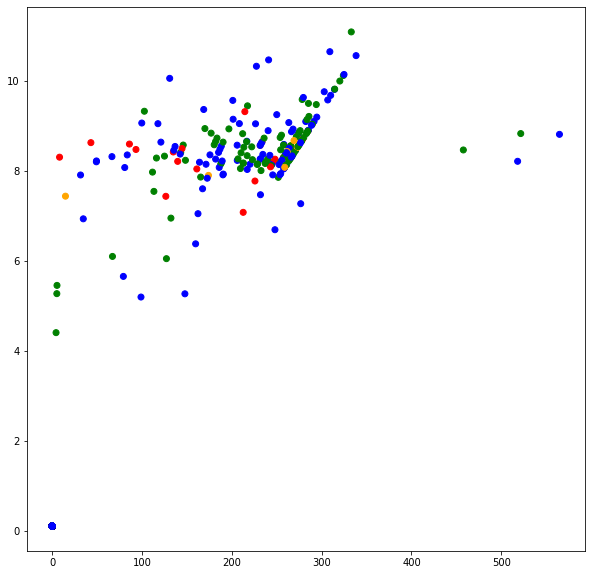

In [105]:
plt.rcParams["figure.figsize"] = (10,10)
plt.scatter(X['Время работы в буд.'], X['Время работы в буд. среднее'],c =colour_list )
plt.show()

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test,train_size=0.5, random_state=42, stratify=y_test)

In [107]:
y_test.value_counts()

type
2       58
0       30
1       15
3        7
dtype: int64

In [108]:
y_train.value_counts()

type
2       182
0        92
1        44
3        12
dtype: int64

In [109]:
print(182/12,182/44,182/92)

15.166666666666666 4.136363636363637 1.9782608695652173


In [110]:
#cat_features=[0,1,2]
cat_features=[0,2,3,4,25,26]
train_dataset = Pool(data=X_train,
                     label=y_train,
                     cat_features=cat_features)
validate_dataset = Pool(data=X_val,
                    label=y_val,
                    cat_features=cat_features)
test_dataset = Pool(data=X_test,
                    label=y_test,
                    cat_features=cat_features)

In [258]:
  model = CatBoostClassifier(random_state = 84,
                           iterations = 300,
                           depth=7,
                           l2_leaf_reg = 5,
                           classes_count=4,
                           #nan_mode = min,
                           #ignored_features=[1,2,5,14,26,28,29,32,33],
                           #ignored_features=[29],
                           eval_metric='MultiClass',
                           #bootstrap_type ='MVS',
                           grow_policy ='Depthwise', #Depthwise, Lossguide
                           #learning_rate=0.01,
                           class_weights = (2,4.15,1,15.15),
                           boosting_type ='Plain', #'Ordered' 'Plain'
                           use_best_model=True,
                           loss_function='MultiClass')


In [264]:
model.fit(train_dataset,eval_set=validate_dataset)

0:	learn: 1.3759499	test: 1.3827619	best: 1.3827619 (0)	total: 19ms	remaining: 5.69s
1:	learn: 1.3695477	test: 1.3838049	best: 1.3827619 (0)	total: 41.1ms	remaining: 6.12s
2:	learn: 1.3665122	test: 1.3825609	best: 1.3825609 (2)	total: 57.3ms	remaining: 5.67s
3:	learn: 1.3630986	test: 1.3812516	best: 1.3812516 (3)	total: 82.8ms	remaining: 6.13s
4:	learn: 1.3569240	test: 1.3768638	best: 1.3768638 (4)	total: 103ms	remaining: 6.08s
5:	learn: 1.3492551	test: 1.3733493	best: 1.3733493 (5)	total: 119ms	remaining: 5.81s
6:	learn: 1.3458425	test: 1.3728581	best: 1.3728581 (6)	total: 133ms	remaining: 5.59s
7:	learn: 1.3345174	test: 1.3723027	best: 1.3723027 (7)	total: 155ms	remaining: 5.66s
8:	learn: 1.3317592	test: 1.3709781	best: 1.3709781 (8)	total: 169ms	remaining: 5.46s
9:	learn: 1.3245226	test: 1.3721521	best: 1.3709781 (8)	total: 184ms	remaining: 5.35s
10:	learn: 1.3193728	test: 1.3682798	best: 1.3682798 (10)	total: 201ms	remaining: 5.29s
11:	learn: 1.3121144	test: 1.3665147	best: 1.36651

In [265]:
pred = model.predict(test_dataset)

In [266]:
df_pred = pd.DataFrame(pred)
df_pred.value_counts()

1    32
2    29
3    26
0    23
dtype: int64

In [268]:
print("Recall score:", recall_score(y_test, pred, average='macro'))

Recall score: 0.5714696223316913


Предсказываем


In [269]:
df_test["ОРГ"]= df_test['id'].str.extract('(\d+)').fillna('')

In [270]:
df_test["ОРГ"].value_counts()

1    191
2     71
Name: ОРГ, dtype: int64

In [271]:
df_test["ОРГ2"] = df_test['id'].str.extract('(\d+\d+)').fillna('').astype(int)

In [272]:
df_test_new = pd.merge(df_test, df_ed , on="id", how='left').drop_duplicates(subset="id")

In [273]:
df_test_new['Табельный номер руководителя'] =np.where(df_test_new['Табельный номер руководителя'].isnull(), 0 ,1)


In [274]:
df_test_new['Вид образования'] = df_test_new['Вид образования'].fillna('Отсутствует/нет данных')
df_test_new['Специальность'] = df_test_new['Специальность'].fillna('Отсутствует/нет данных')

In [275]:
df_test_new

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность
0,ОРГ1-02649,0,1,2649,0,Отсутствует/нет данных,Отсутствует/нет данных
1,ОРГ2-05929,0,2,5929,1,Высшее образование - бакалавриат,Инженерно-геодезическое обеспечение и техничес...
2,ОРГ2-05859,0,2,5859,1,Среднее общее образование,Отсутствует/нет данных
3,ОРГ1-00279,0,1,279,1,Высшее образование,Промышленное и гражданское строительство
5,ОРГ2-01613,0,2,1613,1,"Высшее образование - специалитет, магистратура",Промышленное и гражданское строительство
...,...,...,...,...,...,...,...
359,ОРГ1-02893,0,1,2893,0,Среднее профессиональное образование,Менеджмент
360,ОРГ2-01077,0,2,1077,1,"Высшее образование - специалитет, магистратура",Астрономогеодезия
361,ОРГ1-00469,0,1,469,1,Высшее образование,Менеджмент организации
362,ОРГ1-02060,0,1,2060,0,Высшее образование,"Проектирование, сооружение и эксплуатация газо..."


In [276]:

for i in set(df_tasks['ДлительностьПросрочки'].tolist()):
    df_sup = df_tasks[df_tasks['ДлительностьПросрочки'] == i]
    df_sup = df_sup[["id","ДлительностьПросрочки"]]
    df_sup = df_sup.rename(columns={'ДлительностьПросрочки': i})
    df_sup = df_sup.groupby("id").count()
    df_test_new = pd.merge(df_test_new, df_sup , on="id", how='left')
    df_test_new[i] = df_test_new[i].fillna(0)
df_test_new.head()


for i in set(df_tasks['Вид документа'].tolist()):
    df_sup = df_tasks[df_tasks['Вид документа'] == i]
    df_sup = df_sup[["id",'Вид документа']]
    df_sup = df_sup.rename(columns={'Вид документа': i})
    df_sup = df_sup.groupby("id").count()
    df_test_new = pd.merge(df_test_new, df_sup , on="id", how='left')
    df_test_new[i] = df_test_new[i].fillna(0)
df_test_new.head()

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Исходящий,Запрос на внесение изменений,Отчет по ВА,Файл,Протокол,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение
0,ОРГ1-02649,0,1,2649,0,Отсутствует/нет данных,Отсутствует/нет данных,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ОРГ2-05929,0,2,5929,1,Высшее образование - бакалавриат,Инженерно-геодезическое обеспечение и техничес...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,ОРГ2-05859,0,2,5859,1,Среднее общее образование,Отсутствует/нет данных,0.0,19.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,0.0,0.0
3,ОРГ1-00279,0,1,279,1,Высшее образование,Промышленное и гражданское строительство,8.0,1.0,490.0,...,155.0,0.0,0.0,27.0,0.0,0.0,7.0,181.0,0.0,0.0
4,ОРГ2-01613,0,2,1613,1,"Высшее образование - специалитет, магистратура",Промышленное и гражданское строительство,2.0,1.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [277]:
df_test_new['Наиболее частый тип'] = df_test_new[['Акт',
 'Без вида',
 'Внутренний документ',
 'Внутренний документ для БП синхронизация 1С',
 'Входящий',
 'Договор',
 'Дополнительное соглашение',
 'Запрос на внесение изменений',
 'Исходящий',
 'Исходящий РМЗ',
 'Отчет по ВА',
 'Приказ',
 'Протокол',
 'Распоряжение',
 'Служебная записка',
 'Файл']].idxmax(axis=1)

In [278]:
df_test_new['Наиболее частый тип просрочки'] = df_test_new[['без нарушения срока', 'более 30 дней', 'до 30 дней', 'до 7 дней']].idxmax(axis=1)

In [279]:
df_test_new = pd.merge(df_test_new, df_connection_time_res , on="id", how='left')

In [280]:
df_test_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262 entries, 0 to 261
Data columns (total 30 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           262 non-null    object 
 1   type                                         262 non-null    int64  
 2   ОРГ                                          262 non-null    object 
 3   ОРГ2                                         262 non-null    int64  
 4   Табельный номер руководителя                 262 non-null    int64  
 5   Вид образования                              262 non-null    object 
 6   Специальность                                262 non-null    object 
 7   до 30 дней                                   262 non-null    float64
 8   более 30 дней                                262 non-null    float64
 9   без нарушения срока                          262 non-null    float64
 10  до

In [281]:
df_test_new['Число опозданий'] = df_test_new['Число опозданий'].fillna(0)
df_test_new.head(3)

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Файл,Протокол,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение,Наиболее частый тип,Наиболее частый тип просрочки,Число опозданий
0,ОРГ1-02649,0,1,2649,0,Отсутствует/нет данных,Отсутствует/нет данных,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,0.0
1,ОРГ2-05929,0,2,5929,1,Высшее образование - бакалавриат,Инженерно-геодезическое обеспечение и техничес...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,19.0
2,ОРГ2-05859,0,2,5859,1,Среднее общее образование,Отсутствует/нет данных,0.0,19.0,1.0,...,0.0,0.0,0.0,0.0,19.0,0.0,0.0,Служебная записка,более 30 дней,104.0


In [282]:
#df_test_new = pd.merge(df_test_new, df_SKUD_weekend , on="id", how='left')
#df_test_new['Работа в вых.'] = df_test_new['Работа в вых.'].fillna(0)
#df_test_new['Работа в вых.'] = df_test_new['Работа в вых.'].astype(int)
df_test_new = pd.merge(df_test_new, df_SKUD_weekday , on="id", how='left')
df_test_new = pd.merge(df_test_new, df_SKUD_weekday_mean , on="id", how='left')
df_test_new['Время работы в буд.'] = df_test_new['Время работы в буд.'].fillna(df_test_new['Время работы в буд.'].min())
df_test_new['Время работы в буд. среднее'] = df_test_new['Время работы в буд. среднее'].fillna(df_test_new['Время работы в буд. среднее'].min())

In [283]:
df_test_new.head()

,id,type,ОРГ,ОРГ2,Табельный номер руководителя,Вид образования,Специальность,до 30 дней,более 30 дней,без нарушения срока,...,Внутренний документ,Приказ,Служебная записка,Внутренний документ для БП синхронизация 1С,Дополнительное соглашение,Наиболее частый тип,Наиболее частый тип просрочки,Число опозданий,Время работы в буд.,Время работы в буд. среднее
0,ОРГ1-02649,0,1,2649,0,Отсутствует/нет данных,Отсутствует/нет данных,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,0.0,316.183333,9.880729
1,ОРГ2-05929,0,2,5929,1,Высшее образование - бакалавриат,Инженерно-геодезическое обеспечение и техничес...,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Акт,без нарушения срока,19.0,5.883333,4.419444
2,ОРГ2-05859,0,2,5859,1,Среднее общее образование,Отсутствует/нет данных,0.0,19.0,1.0,...,0.0,0.0,19.0,0.0,0.0,Служебная записка,более 30 дней,104.0,5.883333,4.419444
3,ОРГ1-00279,0,1,279,1,Высшее образование,Промышленное и гражданское строительство,8.0,1.0,490.0,...,0.0,7.0,181.0,0.0,0.0,Служебная записка,без нарушения срока,15.0,153.516667,9.030392
4,ОРГ2-01613,0,2,1613,1,"Высшее образование - специалитет, магистратура",Промышленное и гражданское строительство,2.0,1.0,6.0,...,0.0,0.0,0.0,0.0,0.0,Входящий,без нарушения срока,17.0,5.883333,4.419444


In [284]:
df_test_new = pd.merge(df_test_new, df_calls_ToUser , on="id", how='left')
df_test_new = pd.merge(df_test_new, df_calls_FromUser , on="id", how='left')

In [285]:
df_test_new['CallTime_ToUser'] = df_test_new['CallTime_ToUser'].fillna(0)
df_test_new['CallTime_FromUser'] = df_test_new['CallTime_FromUser'].fillna(0)

In [286]:
df_test_new = pd.merge(df_test_new, df_WD_a , on="id", how='left')
df_test_new = pd.merge(df_test_new, df_WD_m , on="id", how='left')

In [287]:
df_test_new['activeTime'] = df_test_new['activeTime'].fillna(df_test_new['activeTime'].min())
df_test_new['monitorTime'] = df_test_new['monitorTime'].fillna(df_test_new['monitorTime'].min())

In [288]:
df_test_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 262 entries, 0 to 261
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   id                                           262 non-null    object 
 1   type                                         262 non-null    int64  
 2   ОРГ                                          262 non-null    object 
 3   ОРГ2                                         262 non-null    int64  
 4   Табельный номер руководителя                 262 non-null    int64  
 5   Вид образования                              262 non-null    object 
 6   Специальность                                262 non-null    object 
 7   до 30 дней                                   262 non-null    float64
 8   более 30 дней                                262 non-null    float64
 9   без нарушения срока                          262 non-null    float64
 10  до

In [289]:
#создаем выборки
Fin_test = df_test_new.drop(["id", "type"], axis = 1)
Fin_test.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 262 entries, 0 to 261
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   ОРГ                                          262 non-null    object 
 1   ОРГ2                                         262 non-null    int64  
 2   Табельный номер руководителя                 262 non-null    int64  
 3   Вид образования                              262 non-null    object 
 4   Специальность                                262 non-null    object 
 5   до 30 дней                                   262 non-null    float64
 6   более 30 дней                                262 non-null    float64
 7   без нарушения срока                          262 non-null    float64
 8   до 7 дней                                    262 non-null    float64
 9   Без вида                                     262 non-null    float64
 10  До

In [290]:
type_ = model.predict(Fin_test)

In [291]:
df_type_ = pd.DataFrame(type_)
Result = df_test_new[['id','type']]
Result['type'] =df_type_ 
Result.to_csv('Result.csv', index=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
